# 细胞群落计数学习算法VI

In [1]:
# 导入工具包
from imp import reload
from IPython.display import display, Markdown, Latex
from tqdm import tqdm
import seaborn as sns
import math
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage import measure,data,color
from scipy.spatial.distance import cdist
import seaborn as sns
import warnings
import os
import time
warnings.filterwarnings('ignore')

def set_style():
    sns.set_style('whitegrid')
    plt.rcParams['font.sans-serif'] = ['SimHei']
    plt.rcParams['axes.unicode_minus'] = False
    pd.options.display.max_columns = 300
    pd.options.display.max_rows = 1000
    # plt.rcParams['figure.dpi'] = 200
    sns.set_palette('muted')  # 调色板颜色温和
    sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth": 1})

set_style()

def plt_show(img_ndarray, figsize=(24,6), gray=True):
    """默认画灰度图"""
    plt.figure(figsize=figsize)
    plt.grid(False)
    if gray:
        plt.imshow(img_ndarray, 'gray')
    else:
        plt.imshow(img_ndarray)
    plt.show()
    
def prt(*args):
    print(*args)
    pass

## 第五版代码情况


**分三层**：（1）培养皿分割；（2）自适应颜色轮廓提取；（3）逐轮廓的形状分析计数。

**算法思路：**在第二层中根据面积范围调节颜色分割阈值，拿到处理后的颜色轮廓；再分析颜色轮廓的形状，利用“计数轮廓”计数。

**存在的问题：**
-  自适应颜色阈值算法不够精细，目前三个颜色通道采用相同的调节方式
-  自适应颜色阈值的学习率参数选择没有实现自动化
-  3以上个的群落挤在一起时，基于轮廓形状凹凸性的计数算法存在随机的计数误差


**改进方向：**
>1）学习率自动选择，小样本学习。2）对多个挤在一起的轮廓，采用凹点检测来估计轮廓内细胞的个数。 

In [2]:
import sys 
sys.path.append("../")
from cell_count_utils import SegCircle
# from hsv_agent import HsvImgCntAgent
# from contour_analyser import cont_df_analysis

## 算法执行流程

### 分割培养皿

In [3]:
img_file_list_1 = ["../data/cells1/187.jpg", "../data/cells1/296.jpg", "../data/cells1/308.jpg"]

img_file_list_2 = ["../data/cells2/177.jpg", "../data/cells2/216.jpg", "../data/cells2/219.jpg",
                   "../data/cells2/322.jpg", "../data/cells2/330.jpg", "../data/cells2/355.jpg"]
img_file = img_file_list_2[3]
img_file

'../data/cells2/322.jpg'

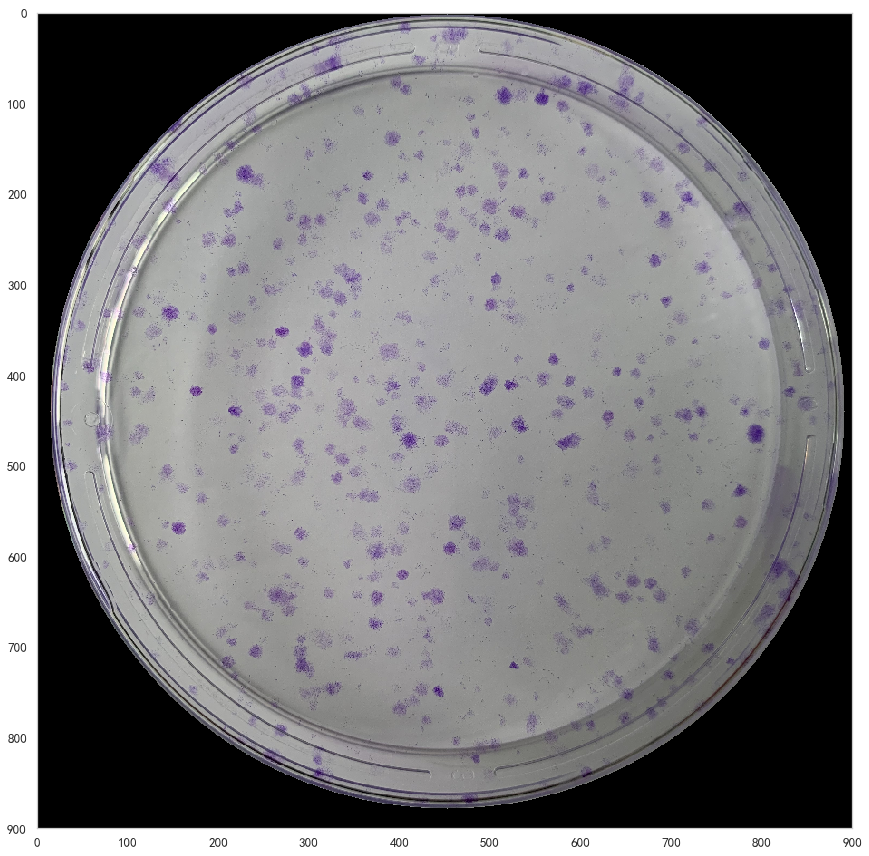

In [4]:
img_bgr = cv2.imread(img_file)  # 读入图像并转换格式
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
# plt_show(img_rgb, figsize=(15,15))

img_seg = SegCircle()  # 实例化一个培养皿分割器
seg_img_rgb = img_seg(img_rgb)  # 分割出培养皿 抹掉其他部分
plt_show(seg_img_rgb, figsize=(15,15))

### 实例化颜色轮廓处理器
**算法超参数结构：**
```python
paticular_engine_config = {
    # 初始杂质过滤的面积参数
    "initial_filtered_cnts_area": 20,
    # 初始颜色阈值参数
    "hsv_low": [100, 20, 50],
    "hsv_up": [200, 250, 150],
    # 轮廓面积参数
    "min_cell_area": 100,  # 120
    "max_cell_area": 5000,  # 2500
    # 自适应阈值参数
    "adjust_ratio_low": 0.1,
    "adjust_ratio_up": 0.0005,
    "good_cell_area": 40,  # 80 40
    # 轮廓分析参数
    "flt_min_area": 20,
    "count_mean_area": 1400,
}
```
实例化对象时，在构造函数中初始化处理颜色轮廓...

处理过程中用最小轮廓面积(`initial_filtered_cnts_area`)过滤一次杂质轮廓。拿到所有的满足初始化颜色阈值和最小面积的轮廓

In [14]:
paticular_engine_config = {
    # 初始杂质过滤的面积参数
    "initial_filtered_cnts_area": 10,  # 这个值可以设置的低一些，保证后续处理的查全率，代价是增加了计算量。
    # 初始颜色阈值参数
    "hsv_low": [100, 20, 50],
    "hsv_up": [200, 250, 200],
    # 轮廓面积参数
    "min_cell_area": 42,  # 标定单个集落最小颜色轮廓面积
    "max_cell_area": 208,  # 标定单个集落最大颜色轮廓面积
    # 自适应阈值参数
    "adjust_ratio_low": 0.5,  # 0.01
    "adjust_ratio_up": 0.5,  # 0.0002
    "good_cell_area": 30,  # 80 40
    # 轮廓分析参数
    "flt_min_area": 10,
    "count_mean_area": 1400}

In [6]:
class HsvImgCntAgent:

    default_config = {
        "hsv_low": [100, 20, 50],
        "hsv_up": [200, 250, 150],
        "initial_filtered_cnts_area": 10,  # 这个参数用于在第一步中过滤杂质 不用于颜色轮廓过滤
        "count_mean_area": 1400
    }  # 这是一个全局的信息，hsv_low - hsv_up

    def __init__(self, img, config=None):
        """
        初始化时拿到用默认阈值分割的轮廓
        :param img: rgb格式图像
        """
        self.img = img
        
        if config is not None:
            self.config = config
        else:
            self.config = self.default_config
            
        self.cnts = self._initial_process(self.config)  

        self.draw_index()  # 在图上显示轮廓的索引 test used
        
        img_ray =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY) 
        img_thresh = cv2.adaptiveThreshold(
                   img_ray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 25, 10)
        plt_show(img_thresh, figsize=(15, 15))

    def _initial_process(self, config):
        """处理流程
        1)颜色分割 --> 2）轮廓过滤
        """
        mask = self._get_mask_hsv_range(self.img, low=config["hsv_low"], up=config["hsv_up"])
        prt("初始HSV阈值分割出来的轮廓：")
        plt_show(mask, figsize=(15, 15))  # test used

        contours, _ = cv2.findContours(  # 拿到轮廓 contours:list[ndarray]
            mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        prt("初始HSV阈值检测颜色轮廓个数：", len(contours))
        prt("initial_filtered_cnts_area", config["initial_filtered_cnts_area"])
        prt("HSV_low", config["hsv_low"])
        selected_cnts = self.filter_cnts(contours, min_area=config["initial_filtered_cnts_area"])  # 初步过滤掉一些轮廓
        prt("初步过滤后的颜色轮廓个数：", len(selected_cnts))

        return selected_cnts

    @staticmethod
    def _get_mask_hsv_range(img, low, up):
        """这里返回的轮廓是后续群落计数的基础
        直接返回过滤后的全图轮廓
        """
        # 1 颜色转换
        img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        # 2 阈值过滤 选出轮廓
        hsv_low = np.array(low)
        hsv_high = np.array(up)
        mask = cv2.inRange(img_hsv, hsv_low, hsv_high)
        # 3 膨胀处理二值轮廓掩膜  这一步的处理 抑制了培养皿边缘的噪音
        kernel = np.ones((3, 3), np.uint8)
        mask_dilate = cv2.dilate(mask, kernel, iterations=1)
        # 4 返回过滤后的二值轮廓图像
        return mask_dilate

    def adjust_hsv_threshold(self, image, config):  # 注意字典类型的变量，传递的是引用，即后续操作改变了这个变量的值，前面的值也会变, 可以把它看成一个全局变量

        img = image.copy()  # 此函数内的img变量是参数image的一个副本，img的改变不会影响原变量image的值
        satisfied = False
        mask = self._get_mask_hsv_range(img, low=config["hsv_low"], up=config["hsv_up"])
        # plt_show(mask, figsize=(15, 15))  # test used

        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  # 拿到轮廓...

        try:
            prt("\n|---------------------------------------> 自适应阈值调节 <-------------------------------------|")
            prt("HSV配置参数: hsv_low={}, hsv_up={}".format(config['hsv_low'], config["hsv_up"]))
            sorted_cnts_area = sorted(map(cv2.contourArea, contours))  # 计算并排序上述轮廓的面积
            prt('轮廓面积：', sorted_cnts_area)

            min_cell_area, max_cell_area = config["min_cell_area"], config["max_cell_area"]
            adjust_ratio_low, adjust_ratio_up = config["adjust_ratio_low"], config["adjust_ratio_up"]

            if sorted_cnts_area[0] < min_cell_area:  # 最小的轮廓面积小于标定面积config["min_cell_area"]，则反馈调整阈值
                min_area_err = sorted_cnts_area[0] - min_cell_area
                error = np.sign(min_area_err)*np.log(np.abs(min_area_err))
                config["hsv_low"] = self.adjust_hsv_config(config["hsv_low"], adjust_ratio_low, error)  # 更新下限的值
                prt('小面积误差修正: 误差:[{}];阈值下限调整为[{}]'.format(min_area_err, config["hsv_low"]))  # 正负的意义...

            if sorted_cnts_area[-1] > max_cell_area:  # 最大的轮廓面积大于标定面积config["max_cell_area"]，则反馈调整阈值
                max_area_err = sorted_cnts_area[-1] - max_cell_area
                error = np.sign(max_area_err)*np.log(np.abs(max_area_err))
                config["hsv_up"] = self.adjust_hsv_config(config["hsv_up"], adjust_ratio_up, error)  # 更新上限的值
                prt('大面积误差修正: 误差:[{}];阈值上限调整为[{}]'.format(max_cell_area, config["hsv_up"]))

            if (sorted_cnts_area[0] > min_cell_area) & (sorted_cnts_area[-1] < max_cell_area):
                prt('各轮廓均满足面积条件,自适应反馈调整结束')
                satisfied = True

        except (ValueError, IndexError):
            prt('HSV阈值范围[{}，{}]下没有轮廓被选出'.format(config["hsv_low"], config["hsv_up"]))

        return satisfied, contours, config

    @staticmethod
    def adjust_hsv_config(hsv_config, adjust_ratio, err):
        """
        根据误差err和调整率adjust_ratio驱动颜色阈值hsv_config
        :param hsv_config:list in dict; 颜色阈值
        :param adjust_ratio: float; 调整率
        :param err: float； 面积误差
        :return: hsv_config; 调整后的颜色阈值
        """
        hsv = np.array(hsv_config)
        hsv = hsv - adjust_ratio * err  # 这里默认一个相关关系，最小的轮廓面积若小于标定面积，即min_area_err < 0, 就提高hsv_low下限，增加检测概率...
        hsv = hsv.astype(np.int32)      # ...若最大的轮廓面积大于标定面积，拉低hsv_up限线的阈值，增加轮廓检出的概率

        hsv[hsv < 20] = 20  # 下确界20
        hsv[hsv > 255] = 200  # 上确界200
        return list(hsv)

    @staticmethod
    def filter_cnts(contours, min_area=20):
        """初步过滤掉一些噪音轮廓
        这里可以进一步添加规则 得到较优质的轮廓
        """
        filtered_cnts = []
        for cnt in contours:
            cnt_area = cv2.contourArea(cnt)
            if cnt_area > min_area:
                filtered_cnts.append(cnt)

        return filtered_cnts

    @staticmethod
    def img_field_select(img, low, up):
        # 1 颜色转换
        img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        # 2 阈值过滤 选出轮廓
        hsv_low = np.array(low)
        hsv_high = np.array(up)
        mask = cv2.inRange(img_hsv, hsv_low, hsv_high)
        # 3 抹掉没有选中的区域
        res = cv2.add(img, np.zeros(np.shape(img), dtype=np.uint8), mask=mask)
        return res

    def draw_index(self):
        """画出轮廓的索引便于逐个分析轮廓"""
        img_draw_temp = self.img.copy()  # 将轮廓画在图像的副本上，并显示图像的副本，不影响原图self.img。
        cv2.drawContours(img_draw_temp, self.cnts, -1, (255, 255, 0), 1)
        for idx, cnt in enumerate(self.cnts):  # 这里索引的顺序是self.cnts的顺序
            try:
#                 cv2.drawContours(img_draw_temp, cnt, -1, (255, 255, 0), 1)
                M = cv2.moments(cnt)
                cx = int(M['m10'] / M['m00'])
                cy = int(M['m01'] / M['m00'])
                cv2.circle(img_draw_temp, (cx, cy), 2, (0, 255, 0), 1)
                cv2.putText(img_draw_temp,
                            str(idx),
                            (cx + 5, cy + 5),
                            cv2.FONT_HERSHEY_COMPLEX_SMALL,
                            0.8, (0, 255, 255), 1)
            except Exception:
                print("missing %d" % idx)
        plt_show(img_draw_temp, figsize=(15, 15))
#         plt.imsave('s-{}_min_area-{}-filter.jpg'
#                    .format(self.default_config["hsv_low"][1],
#                            self.default_config["initial_filtered_cnts_area"]), 
#                    img_draw_temp)
        
    def draw_single_cnts(self, index):
        img_draw_temp = self.img.copy()  # 将轮廓画在图像的副本上，并显示图像的副本，不影响原图self.img。
        cnt = self.cnts[index]
        try:
            cv2.drawContours(img_draw_temp, cnt, -1, (255, 255, 0), 1)
            
            rect = cv2.minAreaRect(cnt)  # 画出最小外接圆看一看
            box = cv2.boxPoints(rect)
            box = np.int0(box)  # int0 等价与int64 将浮点数转换为整数
            cv2.drawContours(img_draw_temp, [box], 0, (255, 0, 0), 2)
            
            M = cv2.moments(cnt)
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            cv2.circle(img_draw_temp, (cx, cy), 2, (0, 255, 0), 1)
            cv2.putText(img_draw_temp,
                        str(index),
                        (cx + 5, cy + 5),
                        cv2.FONT_HERSHEY_COMPLEX_SMALL,
                        0.8, (0, 255, 255), 1)
        except Exception:
            print("missing %d" % index)
        plt_show(img_draw_temp, figsize=(15, 15))

    def adjust_hsv_(self, img, config):
        img = img.copy()
        satisfied = False
        min_cell_area, max_cell_area = config["min_cell_area"], config["max_cell_area"]
        prt(min_cell_area, max_cell_area)

        mask = self._get_mask_hsv_range(img, low=config["hsv_low"], up=config["hsv_up"])
        plt_show(mask, figsize=(15, 15))  # test used
        # 拿到轮廓
        contours, _ = cv2.findContours(
            mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        cv2.drawContours(img, contours, -1, (255, 255, 0), 1)
        plt_show(img, figsize=(15, 15))  # test used

        try:
            sorted_cnts_area = sorted(map(cv2.contourArea, contours)); print('轮廓面积：', sorted_cnts_area)
            if (sorted_cnts_area[0] < min_cell_area) & (sorted_cnts_area[-1] > max_cell_area):
                adjust_ratio_low, adjust_ratio_up = config["adjust_ratio_low"], config["adjust_ratio_up"]
                hsv_low, hsv_up = np.array(config["hsv_low"]), np.array(config["hsv_up"])

                min_area_err = sorted_cnts_area[0] - min_cell_area; print(min_area_err)  # 正负是有意义的
                max_area_err = sorted_cnts_area[-1] - max_cell_area; print(max_area_err)

                hsv_low = hsv_low - adjust_ratio_low * min_area_err
                hsv_up = hsv_up + adjust_ratio_up * max_area_err

                hsv_low[hsv_low < 20] = 20  # 下确界20
                hsv_up[hsv_up > 255] = 200  # 上确界 255 防止越界

                hsv_low = hsv_low.astype(np.int32)
                hsv_up = hsv_up.astype(np.int32)

                config["hsv_low"] = list(hsv_low)
                config["hsv_up"] = list(hsv_up)
            else:
                satisfied = True
        except (ValueError, IndexError):
            print(contours)
        return satisfied, contours

    def adjust_hsv_threshold_(self, image, config):  # 注意字典类型的变量，传递的是引用，即后续操作改变了这个变量的值，前面的值也会变, 可以把它看成一个全局变量
        img = image.copy()  # 此函数内的img变量是参数image的一个副本，img的改变不会影响原变量image的值
        satisfied = False
        mask = self._get_mask_hsv_range(img, low=config["hsv_low"], up=config["hsv_up"])
        # plt_show(mask, figsize=(15, 15))  # test used

        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  # 拿到轮廓...

        try:
            prt("----------------自适应阈值调节---------------")
            sorted_cnts_area = sorted(map(cv2.contourArea, contours))  # 计算并排序上述轮廓的面积
            prt('轮廓面积：', sorted_cnts_area)

            min_cell_area, max_cell_area = config["min_cell_area"], config["max_cell_area"]
            adjust_ratio_low, adjust_ratio_up = config["adjust_ratio_low"], config["adjust_ratio_up"]
            hsv_low, hsv_up = np.array(config["hsv_low"]), np.array(config["hsv_up"])

            if sorted_cnts_area[0] < min_cell_area:  # 最小的轮廓面积小于标定面积config["min_cell_area"]，则反馈调整阈值
                min_area_err = sorted_cnts_area[0] - min_cell_area
                hsv_low = hsv_low - adjust_ratio_low * min_area_err  # ...这里默认一个相关关系，最小的轮廓面积若小于标定面积，即min_area_err < 0, 就提高hsv_low下限，增加检测概率
                hsv_low[hsv_low < 20] = 20  # 下确界20
                hsv_low = hsv_low.astype(np.int32)
                config["hsv_low"] = list(hsv_low)  # 更新下限的值
                prt(config["hsv_low"])

            if sorted_cnts_area[-1] > max_cell_area:  # 最大的轮廓面积大于标定面积config["max_cell_area"]，则反馈调整阈值
                max_area_err = sorted_cnts_area[-1] - max_cell_area
                hsv_up = hsv_up - adjust_ratio_up * max_area_err
                hsv_up[hsv_up > 255] = 200  # 上确界 255 防止越界
                hsv_up = hsv_up.astype(np.int32)
                config["hsv_up"] = list(hsv_up)  # 更新上限的值
                prt(config["hsv_up"])

            if (sorted_cnts_area[0] > min_cell_area) & (sorted_cnts_area[-1] < max_cell_area):
                prt('各轮廓均满足面积条件,自适应反馈调整结束')
                satisfied = True

        except (ValueError, IndexError):
            prt('空列表：', contours, "config:", config["hsv_low"], config["hsv_up"])
            pass

        return satisfied, contours, config

初始HSV阈值分割出来的轮廓：


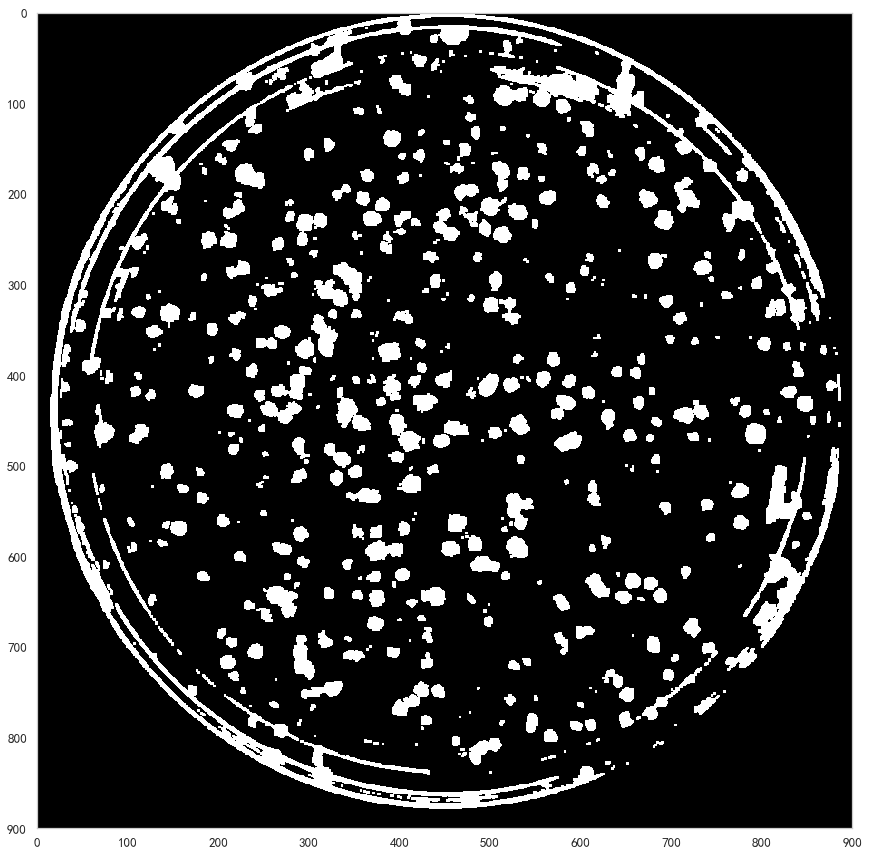

初始HSV阈值检测颜色轮廓个数： 499
initial_filtered_cnts_area 10
HSV_low [100, 20, 50]
初步过滤后的颜色轮廓个数： 383


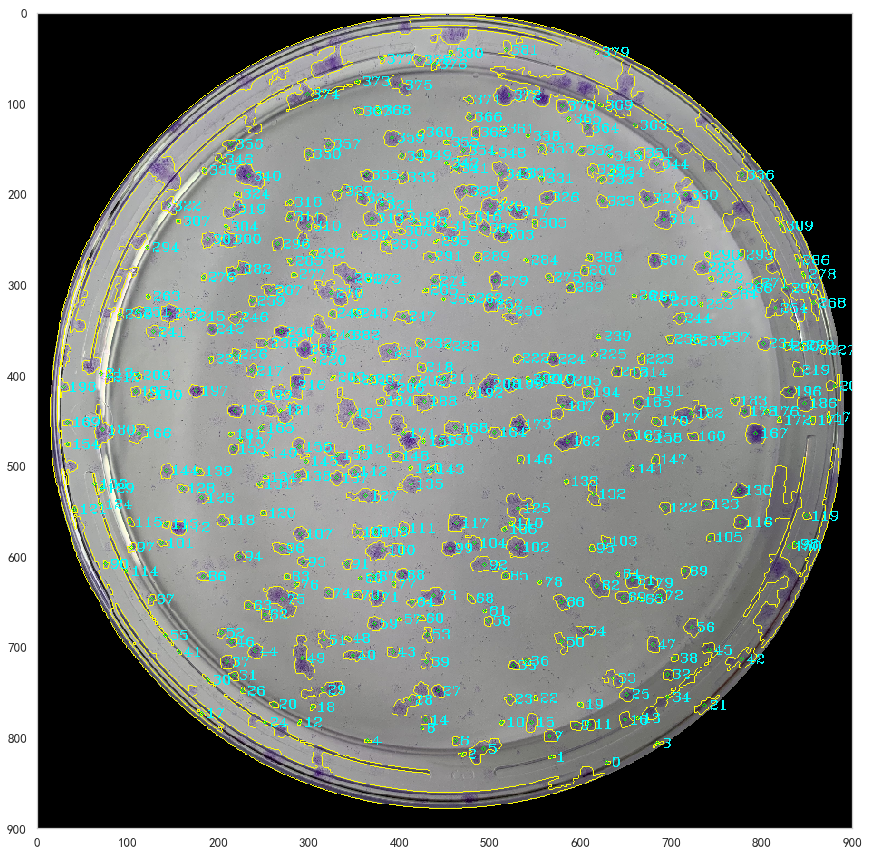

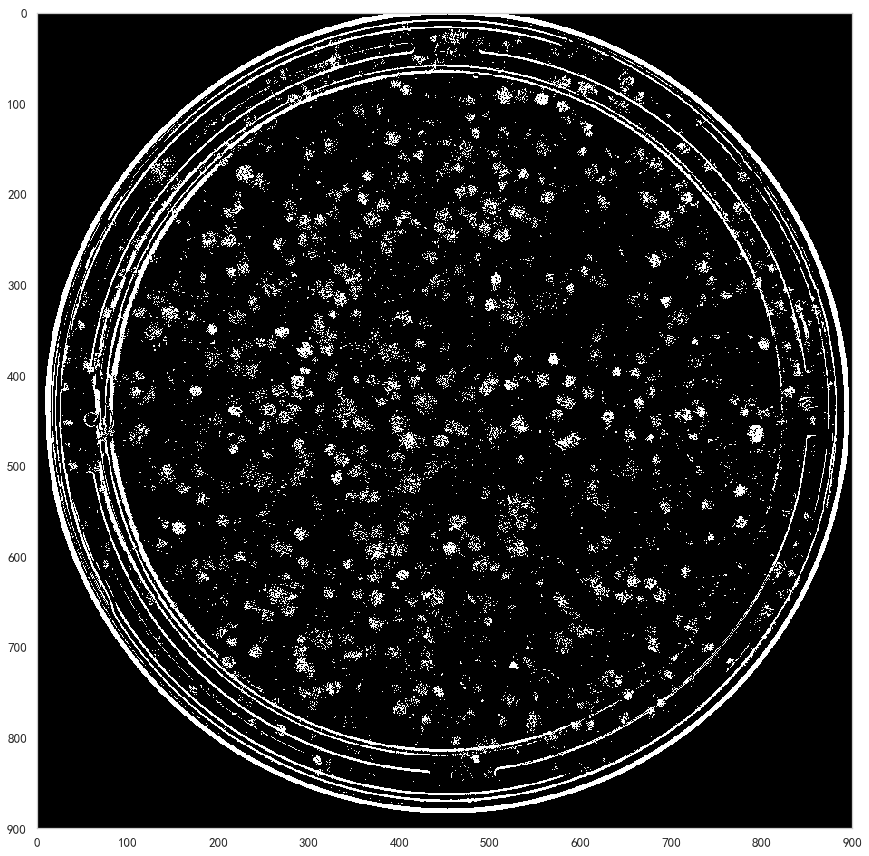

In [15]:
hsv_agent = HsvImgCntAgent(seg_img_rgb, paticular_engine_config)  # 过滤出轮廓  

In [16]:
def cont_df_analysis(contours):
    print('轮廓总个数:', len(contours))
    # print('轮廓总个数:', np.array(contours).shape[0])
    cont_arc_length = []  # 轮廓周长
    hull = []  # 轮廓凸包
    hull_arc_length = []  # 凸包周长
    cnt_bounding_rect_w = []
    cnt_bounding_rect_h = []
    for i in range(len(contours)):
        hull.append(cv2.convexHull(contours[i], True))  # 轮廓凸包
        cont_arc_length.append(cv2.arcLength(contours[i], True))  # 轮廓周长
        hull_arc_length.append(cv2.arcLength(hull[i], True))  # 轮廓凸包周长
        (x, y), (w, h), alph = cv2.minAreaRect(contours[i])
        cnt_bounding_rect_w.append(w)
        cnt_bounding_rect_h.append(h)
    cont_area = []
    hull_area = []
    for i in range(len(contours)):
        cont_area.append(cv2.contourArea(contours[i]))
        hull_area.append(cv2.contourArea(hull[i]))

    df_area = pd.DataFrame({
        'area': cont_area,
        'area_hull': hull_area,
        'arc_length': cont_arc_length,
        'arc_length_hull': hull_arc_length,
        'rect_w': cnt_bounding_rect_w,
        'rect_h': cnt_bounding_rect_h,
    })

    df_area['r1'] = df_area['area'] / df_area['arc_length']  # 轮廓面积 / 轮廓周长 = 面积周长比
    df_area['r2'] = df_area['arc_length'] / df_area['arc_length_hull']
    df_area['w/h'] = df_area['rect_w'] / df_area['rect_h']
    df_area['d1'] = df_area['area_hull'] - df_area['area']  # 凸包的面积 - 轮廓的面积

    return df_area

In [17]:
df_cnts = cont_df_analysis(hsv_agent.cnts)

轮廓总个数: 383


In [12]:
df_cnts.sort_values(["area"])

,area,area_hull,arc_length,arc_length_hull,rect_w,rect_h,r1,r2,w/h,d1
84,10.5,11.0,13.414214,13.236068,4.000000,3.000000,0.782752,1.013459,1.333333,0.5
8,10.5,11.0,13.414214,13.236068,4.000000,3.000000,0.782752,1.013459,1.333333,0.5
273,11.0,17.0,18.828427,17.077687,7.155417,3.130495,0.584223,1.102516,2.285714,6.0
379,11.0,11.0,12.828427,12.828427,3.000000,4.000000,0.857471,1.000000,0.750000,0.0
255,11.0,11.0,12.828427,12.828427,3.000000,4.000000,0.857471,1.000000,0.750000,0.0
358,11.0,11.0,12.828427,12.828427,3.000000,4.000000,0.857471,1.000000,0.750000,0.0
260,11.5,11.5,13.414214,13.414214,3.000000,4.000000,0.857300,1.000000,0.750000,0.0
365,11.5,11.5,13.414214,13.414214,4.000000,3.000000,0.857300,1.000000,1.333333,0.0
237,11.5,11.5,13.414214,13.414214,3.000000,4.000000,0.857300,1.000000,0.750000,0.0
61,12.0,12.0,14.000000,14.000000,4.000000,3.000000,0.857143,1.000000,1.333333,0.0


In [13]:
df_cnts.describe()

,area,area_hull,arc_length,arc_length_hull,rect_w,rect_h,r1,r2,w/h,d1
count,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000
mean,264.114883,1678.485640,78.185230,54.960489,16.284625,16.291506,2.456632,1.086239,1.067474,1414.370757
std,1917.679829,28547.467659,458.213524,141.047654,46.542794,40.340869,1.127387,0.151951,0.512880,26648.704209
min,10.500000,11.000000,12.828427,12.828427,2.828427,2.000000,0.584223,1.000000,0.066929,0.000000
25%,42.750000,46.500000,27.656854,26.293480,7.000000,8.000000,1.485912,1.027562,0.800000,3.250000
50%,108.500000,114.000000,42.970562,40.912687,11.243920,12.000000,2.353794,1.051247,1.000000,8.500000
75%,208.250000,227.500000,61.091883,57.382101,17.000000,16.796227,3.310075,1.098297,1.207143,21.500000
max,37225.500000,558749.000000,8916.172578,2698.059872,878.077637,764.773376,5.480028,3.304661,5.456331,521523.500000


In [43]:
df1 = df_cnts[30<df_cnts["area"]]
df2 = df1[df_cnts["area"]<600]
df2.describe()

,area,area_hull,arc_length,arc_length_hull,rect_w,rect_h,r1,r2,w/h,d1
count,177.000000,177.000000,177.000000,177.000000,177.000000,177.000000,177.000000,177.000000,177.000000,177.000000
mean,106.841808,138.742938,53.156447,48.437197,14.541697,12.987266,1.945569,1.067157,1.766961,31.901130
std,96.431619,163.459632,41.914744,35.144540,15.470034,12.246604,0.669971,0.090054,2.506656,78.216647
min,30.500000,31.500000,21.656854,21.404918,2.000000,3.000000,0.833112,1.000000,0.080000,0.000000
25%,47.000000,50.000000,29.071068,27.520728,7.000000,7.000000,1.467627,1.020594,0.818182,2.500000
50%,70.000000,75.500000,36.142135,34.730322,9.000000,9.000000,1.782096,1.040084,1.000000,6.000000
75%,121.500000,141.000000,59.899495,53.841397,14.000000,14.000000,2.234099,1.073078,1.400000,25.000000
max,512.500000,1190.500000,273.254833,262.533497,128.984024,84.385918,4.352741,1.651335,16.222223,678.000000


In [44]:
df2

,area,area_hull,arc_length,arc_length_hull,rect_w,rect_h,r1,r2,w/h,d1
0,31.0,33.5,23.656854,22.870482,8.000000,5.000000,1.310402,1.034384,1.600000,2.5
1,70.0,71.0,31.313708,30.957417,9.000000,9.000000,2.235443,1.011509,1.000000,1.0
2,33.5,34.5,23.414214,23.162278,6.000000,6.000000,1.430755,1.010877,1.000000,1.0
3,41.5,45.0,25.899495,24.756831,6.708203,8.049845,1.602348,1.046155,0.833333,3.5
5,238.0,479.0,130.769552,106.085163,46.667244,14.726551,1.819996,1.232685,3.168919,241.0
7,54.5,60.5,33.071068,31.289474,11.000000,7.000000,1.647966,1.056939,1.571429,6.0
10,512.5,1190.5,199.154328,153.827714,63.816238,21.903336,2.573381,1.294658,2.913540,678.0
11,34.5,34.5,22.242641,22.242641,6.000000,6.000000,1.551075,1.000000,1.000000,0.0
12,331.0,409.5,92.769552,80.974149,32.310989,15.041323,3.567981,1.145669,2.148148,78.5
14,246.5,276.5,70.041630,62.493497,19.000000,17.000000,3.519336,1.120783,1.117647,30.0


### 实例化轮廓形状分析器
逐个分析，以上颜色轮廓

In [18]:
class PopuCntAnalyser:
    """
    分析每个轮廓中一共有几个群落
    以轮廓贯穿处理流程：
        1）自适应颜色阈值 逐个处理用默认阈值筛选出的轮廓
        2）对处理后的颜色轮廓做形状分析
            先画一些辅助图以bin_开头
            没有连接在一起的群落直接计数
            连在一起的群落用“计数轮廓”算细胞个数
    """
    def __init__(self, img_src, config, agent=None, adaptive=True):
        """

        :param counters: cv.findContours); 出入进来初步过滤后的轮廓
        :param img_src: ndarray; 处理过的图像，这里是分割培养皿后的图片
        :param config:
        :param agent:
        :param adaptive:
        """
        self.cnts = agent.cnts  # 传进来所有的轮廓
        self.img = img_src.copy()
        self.config = config
        self.config_temp = config
        self.agent = agent
        self.adaptive = adaptive
        self.total_popu = 0
        self.h, self.w, _ = img_src.shape

    def __getitem__(self, index):
        img_draw = self.img  # 每次都把轮廓画到同一张图上
        cnt = self.cnts[index]  # 轮廓

        cnts_num, adaptive_cnts = self.adaptive_hsv_counter(cnt)

        if cnts_num != 0:
            for cnt in adaptive_cnts:
                popu_num = self.cnts_counting(cnt)
                if popu_num != 0:
                    self.total_popu += popu_num
                    self.draw_number(img_draw, cnt, popu_num)

    def getitem_test(self, index):
        img_draw = self.img.copy()  # 每次把轮廓画到不同的图上 test used
        # img_draw = self.img  # 每次都把轮廓画到同一张图上
        cnt = self.cnts[index]  # 轮廓
        prt('|######################################## 处理轮廓[%d] #######################################|' % index)

        cnts_num, adaptive_cnts = self.adaptive_hsv_counter(cnt)

        if cnts_num != 0:
            prt("满足颜色面积条件")
            for cnt in adaptive_cnts:
                popu_num = self.cnts_counting(cnt)
                self.total_popu += popu_num
                # self.draw_number(img_draw, cnt, popu_num)
            self.show_cnt_info(img_draw, adaptive_cnts, index, popu_num)

        else:  # 测试使用
            prt("假轮廓")
            self.show_cnt_info(img_draw, [cnt], index, cnts_num)
            popu_num = 0
        prt('|###################################### 轮廓[{}]有[{}]个细胞 #########################3#########|\n'
            .format(index, popu_num))

    def adaptive_hsv_counter(self, cnt):
        """自适应阈值计数器：输入局部轮廓图，输出这个轮廓中细胞集落数和处理过的轮廓"""
        # img = self.img.copy()
        config = self.config.copy()
        # 2 所有轮廓均满足条件 全部算数
        rgb_hull = self.rgb_hull(cnt)  # 只有当前轮廓范围的彩色图
        # plt_show(rgb_hull, figsize=(15, 15))
        for i in range(5):
            satisfied, adjusted_cnts, config = self.agent.adjust_hsv_threshold(rgb_hull, config)
            if satisfied:
                return len(adjusted_cnts), adjusted_cnts

        good_adjusted_cnts = []  # 如果没有satisfied，说明存在不满足条件的轮廓，再过滤一下
        for cnt in adjusted_cnts:
            if cv2.contourArea(cnt) >= self.config["good_cell_area"]:
                good_adjusted_cnts.append(cnt)
        # cv2.drawContours(img, good_adjusted_cnts, -1, (255, 255, 0), 1)  # ...把轮廓画出来看看
        # plt_show(img, figsize=(15, 15))  # test used
        return len(good_adjusted_cnts), good_adjusted_cnts

    def cnts_counting(self, cnt):
        (x, y), (w, h), alph = cv2.minAreaRect(cnt)
        if 5 < w < 200 and 5 < h < 200  and 0.25 < w/h < 4:
            cnt_area = cv2.contourArea(cnt)
            prt('轮廓形状分析，面积{}'.format(cnt_area))
            if cnt_area <= 200:  # 一个小的群落
                popu_num = 1
            elif 200 < cnt_area <= 4000:  # 分析连接在一起的轮廓中有几个群落  大轮廓 - 小轮廓 的图
                bin_sub_thresh = self._bin_count_with_hull(cnt)
                popu_num = self.cont_popu_cnts(bin_sub_thresh)
                if popu_num == 0:  # 这个轮廓的计数凹轮廓为0 本身是一个大的圆润的轮廓
                    popu_num += 1
            else:
                popu_num = self._bin_count_big_popu(cnt)
            return popu_num
        else:
            prt('不符合轮廓条件，过滤')
            return 0

    def cont_popu_cnts(self, img_gray):
        """在生成轮廓的同时，过滤一些面积很小的轮廓
        args:
            img_gray:处理过的二值图像，包含用于计数的轮廓
        ret:
            good_cnts: 计数轮廓
        TODO：这个地方还可以做一些优化
        """
        good_cnts = []
        cnts, _ = cv2.findContours(img_gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        for cnt in cnts:
            area = cv2.contourArea(cnt)
            # print(area)
            if area > self.config["flt_min_area"]:  # 对凹的计数轮廓的面积限定
                good_cnts.append(cnt)
        return len(good_cnts)

    @staticmethod
    def draw_number(img, cnt, num):
        """将轮廓中群落的个数 写在轮廓旁边"""
        cv2.drawContours(img, cnt, -1, (255, 255, 0), 1)  # 将轮廓cnt画到图img_draw上
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.circle(img, (cx, cy), 2, (0, 255, 0), cv2.FILLED)
        cv2.putText(img, str(num), (cx + 5, cy - 10),
                    cv2.FONT_HERSHEY_PLAIN, 1, (0, 255, 255), 1)

    @staticmethod
    def _draw_index(img, cnt, index):
        """辅助函数：画出轮廓的索引用于后续分析"""
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.circle(img, (cx, cy), 2, (0, 255, 0), 1)
        cv2.putText(img, str(index), (cx + 5, cy + 5),
                    cv2.FONT_HERSHEY_COMPLEX_SMALL, 0.8, (0, 255, 0), 1)

    @staticmethod
    def show_cnt_info(img, cnts, index, popu_num):
        """将轮廓中群落的个数 写在轮廓旁边"""
        h, w, _ = img.shape
        cv2.drawContours(img, cnts, -1, (255, 255, 0), 1)  # 将轮廓cnt画到图img_draw上
        # plt_show(img, figsize=(15, 15))
        try:
            for i, cnt in enumerate(cnts):

                M = cv2.moments(cnt)
                cx = int(M['m10'] / M['m00'])
                cy = int(M['m01'] / M['m00'])
                cv2.circle(img, (cx, cy), 2, (0, 255, 0), cv2.FILLED)
                
                rect = cv2.minAreaRect(cnt)
                box = cv2.boxPoints(rect)
                box = np.int0(box)  # int0 等价与int64 将浮点数转换为整数
                cv2.drawContours(img, [box], 0, (0, 0, 255), 1)
                
                if cx + 200 > w:  # 防止字写到图像外面去了
                    cx = cx - 100
                if cy - 80 < 0:
                    cy += 100

                if i < 1:  # index 只写一次
                    cv2.putText(img, 'Idx:' + str(index), (cx + 20, cy - 20),
                                cv2.FONT_HERSHEY_PLAIN, 2, (0, 255, 0), 2)

                if len(cnts) > 1 and popu_num != 0:  # 单个和多个轮廓采用不同标记方式
                    cv2.putText(img, str(i + 1), (cx + 20, cy + 5),
                                cv2.FONT_HERSHEY_PLAIN, 2, (0, 255, 255), 2)
                else:
                    cv2.putText(img, 'Num:' + str(popu_num), (cx + 20, cy + 5),
                              cv2.FONT_HERSHEY_PLAIN, 2, (0, 255, 255), 2)

        except Exception:
            prt("Missing Info: index[%d]" % index)

        plt_show(img, figsize=(15, 15))
#         plt.imsave("test_imgs/{}.jpg".format(index), img)

    def show_count_result(self):
        cv2.putText(self.img, str(self.total_popu), (50, 80),
                    cv2.FONT_HERSHEY_COMPLEX_SMALL, 3, (255, 255, 0), 3)
        plt_show_(self.img, figsize=(15, 15))

    def rgb_hull(self, cnt):
        """显示原图上某个轮廓凸包下的图像"""
        img_bin = np.zeros((self.h, self.w))
        # hull = cv2.convexHull(cnt, False)
        mask = cv2.drawContours(img_bin, [cnt], -1, 255, cv2.FILLED)
        mask = mask.astype(np.uint8)
        res = cv2.add(self.img, np.zeros(np.shape(self.img), dtype=np.uint8), mask=mask)
        return res

    def bin_contours(self, cnt):
        """在二值图上画出轮廓的填充图"""
        img_bin = np.zeros((self.h, self.w))
        draw_bin = cv2.drawContours(img_bin, [cnt], -1, 255, cv2.FILLED)
        return draw_bin

    def bin_hull(self, cnt):
        """在二值图上画出轮廓凸包的填充图"""
        img_bin = np.zeros((self.h, self.w))
        hull = cv2.convexHull(cnt, False)
        res = cv2.drawContours(img_bin, [hull], -1, 255, cv2.FILLED)
        # plt_show(res, figsize=(15, 15))
        # print(res.shape, res.dtype)
        return res

    def _bin_count_with_hull(self, cnt):
        """使用轮廓外接凸包减去轮廓后剩下的图形作为计数轮廓
        inp：轮廓列表
        out: 凹轮廓二值图
        """

        bin_hull = self.bin_hull(cnt)
        bin_cnt = self.bin_contours(cnt)
        bin_sub = cv2.subtract(bin_hull, bin_cnt)
        bin_sub = bin_sub.astype(np.uint8)  # .astype(np.unit8) np数值类型转化
        _, bin_sub_thresh = cv2.threshold(bin_sub, 50, 255, cv2.THRESH_BINARY)
        # plt_show(bin_hull, figsize=(20,15))
        # plt_show(bin_cnt, figsize=(20,15))
        # plt_show(bin_sub_thresh, figsize=(20, 15))
        return bin_sub_thresh

    def _bin_count_big_popu(self, cnt):
        """这里首要考虑的事情是腐蚀轮廓拉开连在一起的群落"""
        accumulate_popu_num = 0
        bin_cnt = self.bin_contours(cnt)
        # plt_show(bin_cnt, figsize=(20,15))

        kernel = np.ones((3, 3), np.uint8)
        bin_cnt_erode = cv2.erode(bin_cnt, kernel, iterations=4)
        # plt_show(bin_cnt_erode, figsize=(20,15))

        bin_cnt_erode = bin_cnt_erode.astype(np.uint8)
        # _, bin_cnt_erode_thresh = cv2.threshold(bin_cnt_erode, 50, 255, cv2.THRESH_BINARY)
        # plt_show(bin_cnt_erode_thresh, figsize=(20,15))
        #
        # bin_cnt_erode = bin_cnt_erode.astype(np.uint8)
        cnts, _ = cv2.findContours(bin_cnt_erode, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        # print("轮廓个数：", len(cnts))
        for cnt in cnts:
            cnt_area = cv2.contourArea(cnt)
            # print(cnt_area)
            if cnt_area > 6000:  # 如果腐蚀之后轮廓还是很大就直接用面积近似计算
                popu_num = math.ceil(cnt_area / self.config["count_mean_area"])
                # TODO：面积处理  是不是要做递归处理？
                accumulate_popu_num += popu_num
            else:  # 仍然使用凹轮廓计数
                img_bin = self._bin_count_with_hull(cnt)
                # plt_show(img_bin,  figsize=(20,15))
                popu_num = self.cont_popu_cnts(img_bin)
                if popu_num == 0:  # 一个很圆润的轮廓可能没有 凹的计数轮廓
                    popu_num += 1
                accumulate_popu_num += popu_num
        # kernel = np.ones((3,3),np.uint8)
        # bin_cnt_opening = cv2.morphologyEx(bin_cnt_erode, cv2.MORPH_OPEN, kernel)

        # plt_show(bin_cnt_erode_thresh, figsize=(20,15))
        # plt_show(bin_cnt, figsize=(20,15))
        # plt_show(bin_sub_thresh, figsize=(20,15))
        # print('大轮廓中群落的个数为', accumulate_popu_num)
        return accumulate_popu_num

In [19]:
popu_analyser = PopuCntAnalyser(seg_img_rgb, paticular_engine_config, agent=hsv_agent, adaptive=True)

In [73]:
# ill_cnts_list = [30, 42, 102, 114, 129, 134, 139, 146, 159, 191, 198, 200]
ill_cnts_list = [239, 82, 114, 222, 92, 42]

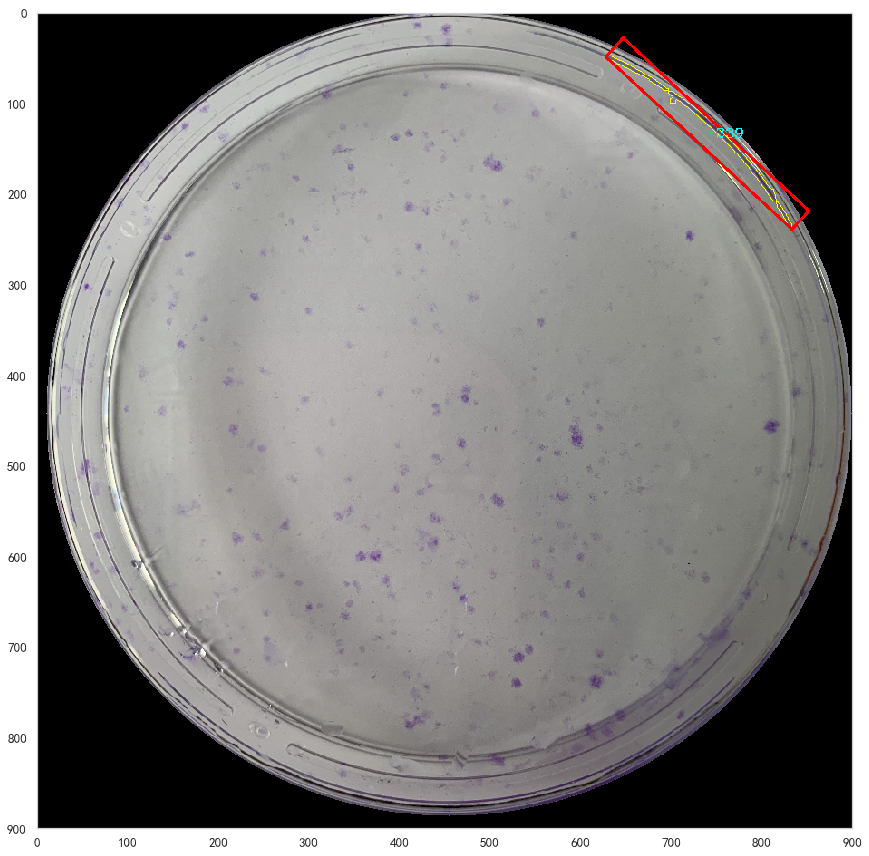

|######################################## 处理轮廓[239] #######################################|

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[100, 20, 50], hsv_up=[200, 250, 200]
轮廓面积： [1300.5]
各轮廓均满足面积条件,自适应反馈调整结束
满足颜色面积条件
不符合轮廓条件，过滤


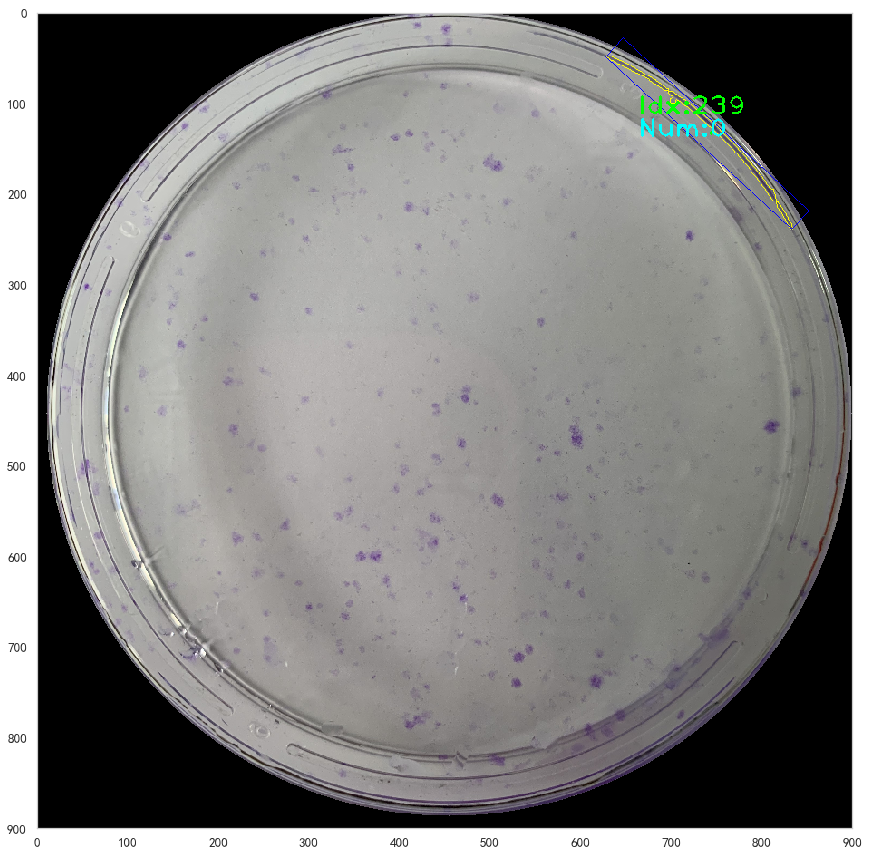

|###################################### 轮廓[239]有[0]个细胞 #########################3#########|



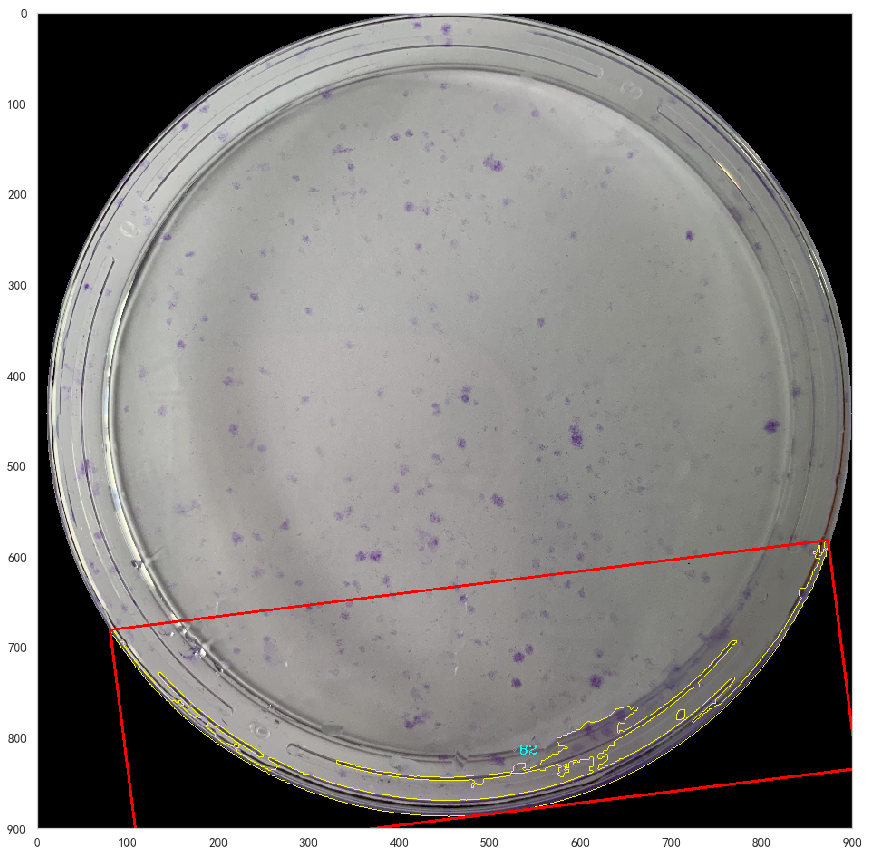

|######################################## 处理轮廓[82] #######################################|

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[100, 20, 50], hsv_up=[200, 250, 200]
轮廓面积： [17601.5]
大面积误差修正: 误差:[1500];阈值上限调整为[[195, 245, 195]]

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[100, 20, 50], hsv_up=[195, 245, 195]
轮廓面积： [17601.5]
大面积误差修正: 误差:[1500];阈值上限调整为[[190, 240, 190]]

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[100, 20, 50], hsv_up=[190, 240, 190]
轮廓面积： [17601.5]
大面积误差修正: 误差:[1500];阈值上限调整为[[185, 235, 185]]

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[100, 20, 50], hsv_up=[185, 235, 185]
轮廓面积： [17601.5]
大面积误差修正: 误差:[1500];阈值上限调整为[[180, 230, 180]]

|---------------------------------------> 自适应阈值调节 <--------------------------------

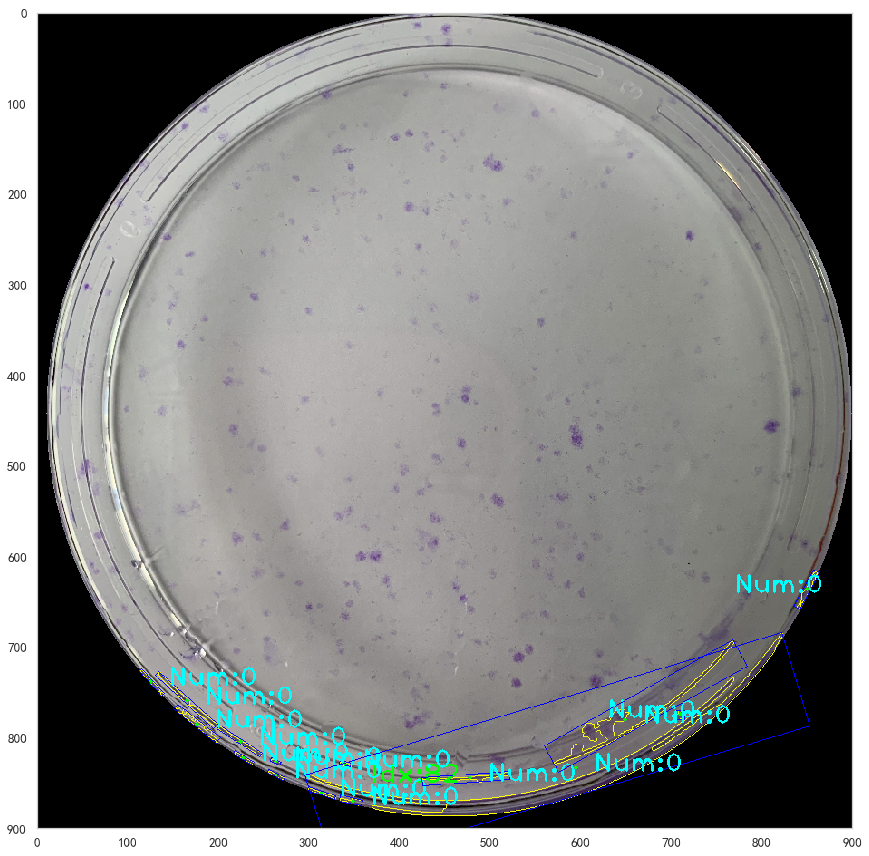

|###################################### 轮廓[82]有[0]个细胞 #########################3#########|



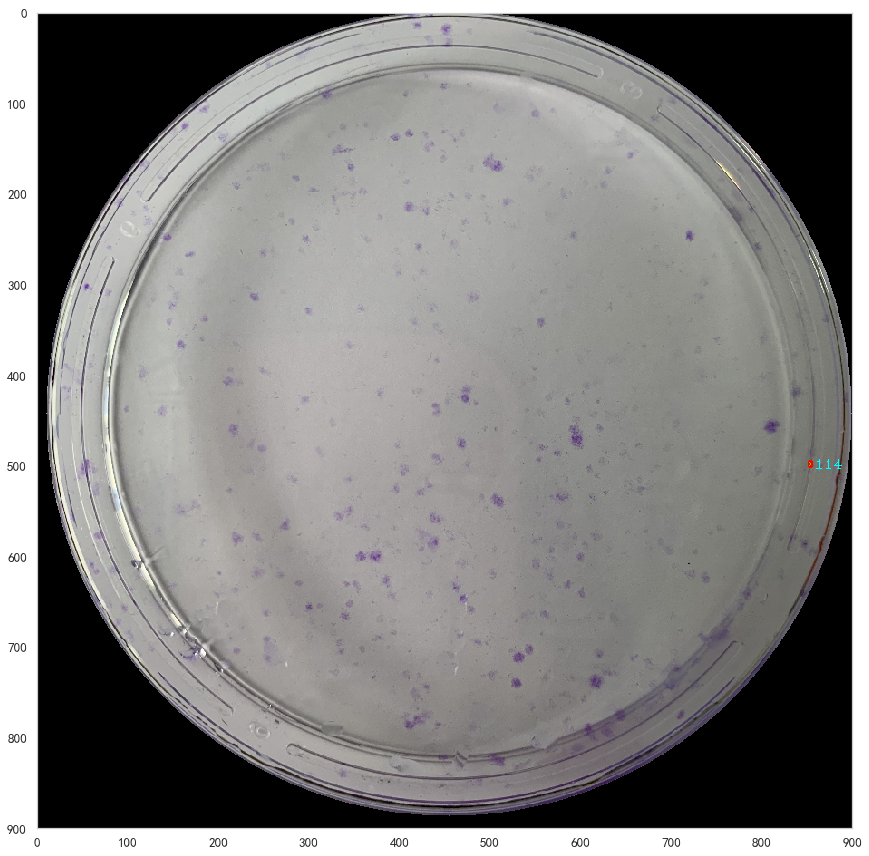

|######################################## 处理轮廓[114] #######################################|

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[100, 20, 50], hsv_up=[200, 250, 200]
轮廓面积： [18.0]
小面积误差修正: 误差:[-62.0];阈值下限调整为[[104, 24, 54]]

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[104, 24, 54], hsv_up=[200, 250, 200]
轮廓面积： [17.5]
小面积误差修正: 误差:[-62.5];阈值下限调整为[[108, 28, 58]]

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[108, 28, 58], hsv_up=[200, 250, 200]
轮廓面积： [17.5]
小面积误差修正: 误差:[-62.5];阈值下限调整为[[112, 32, 62]]

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[112, 32, 62], hsv_up=[200, 250, 200]
轮廓面积： [17.0]
小面积误差修正: 误差:[-63.0];阈值下限调整为[[116, 36, 66]]

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数:

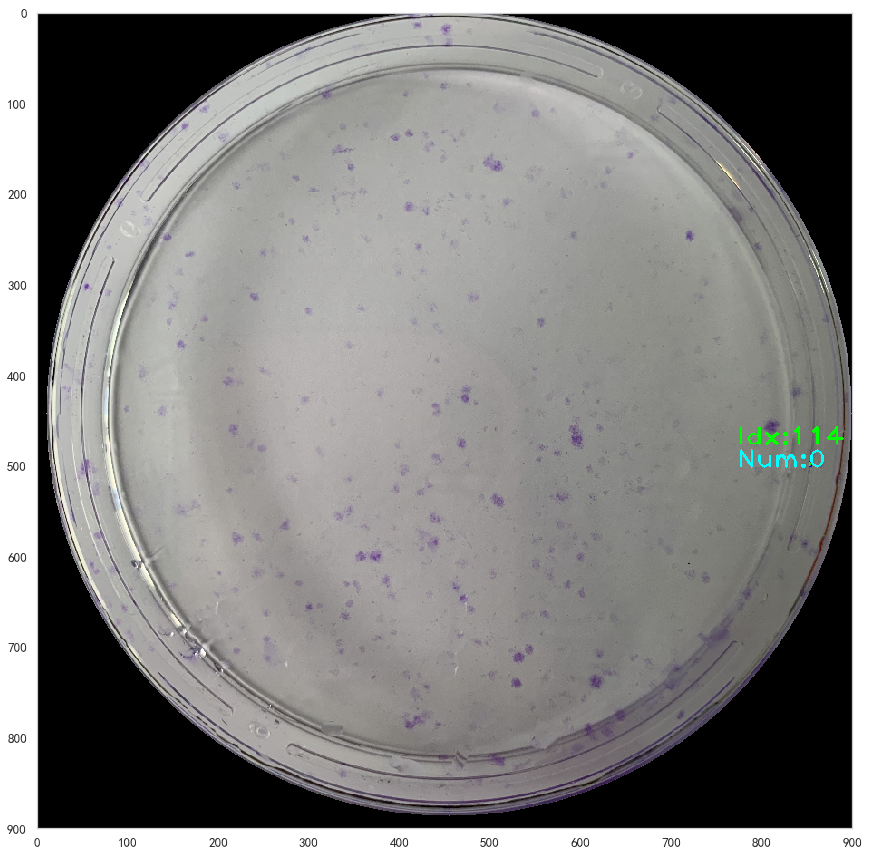

|###################################### 轮廓[114]有[0]个细胞 #########################3#########|



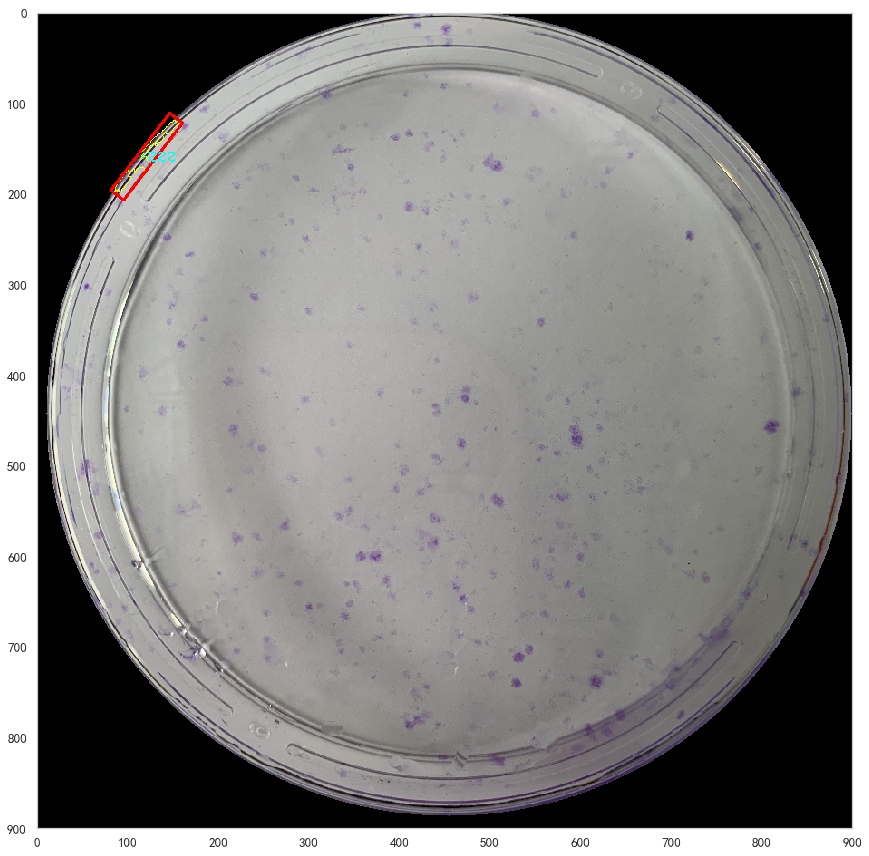

|######################################## 处理轮廓[222] #######################################|

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[100, 20, 50], hsv_up=[200, 250, 200]
轮廓面积： [709.0]
各轮廓均满足面积条件,自适应反馈调整结束
满足颜色面积条件
不符合轮廓条件，过滤


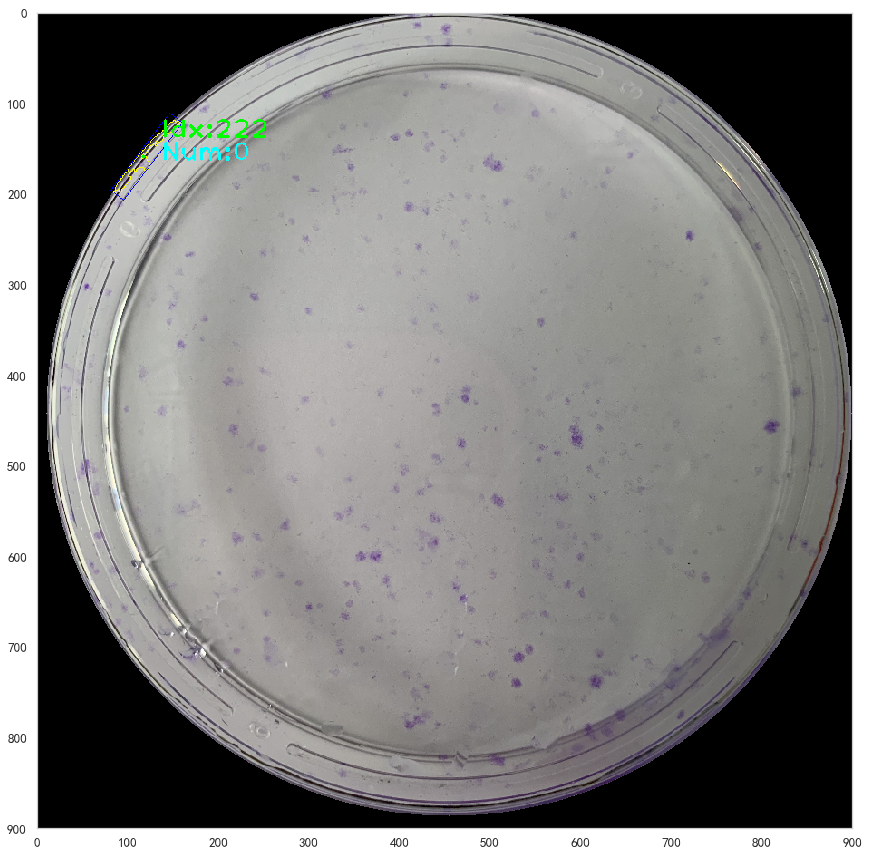

|###################################### 轮廓[222]有[0]个细胞 #########################3#########|



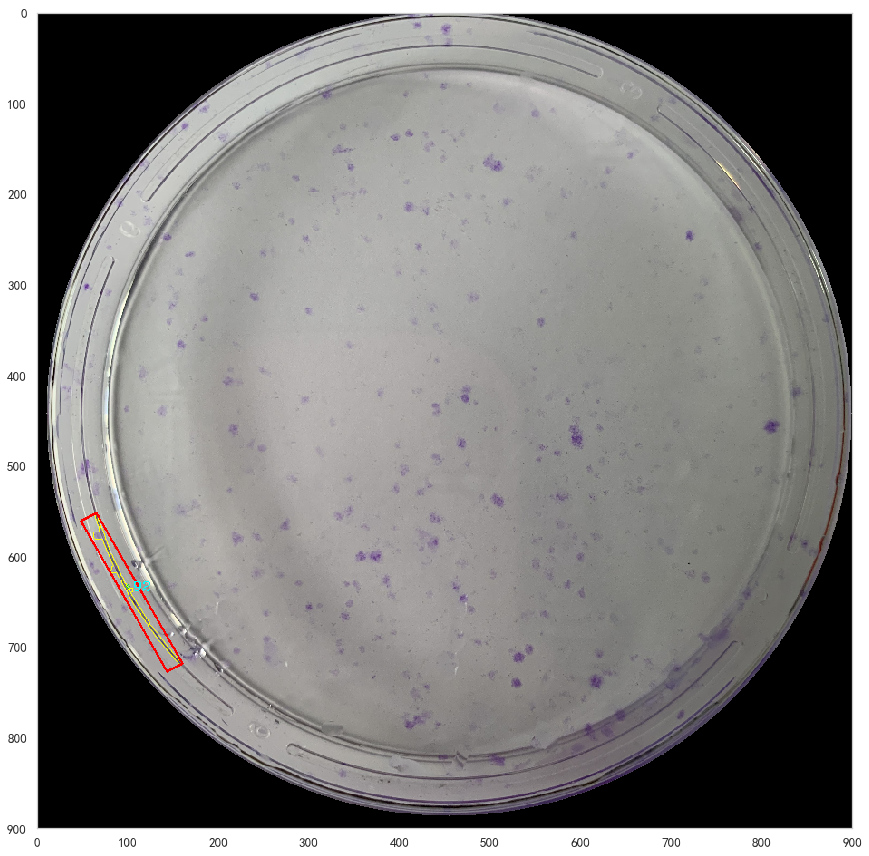

|######################################## 处理轮廓[92] #######################################|

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[100, 20, 50], hsv_up=[200, 250, 200]
轮廓面积： [729.0]
各轮廓均满足面积条件,自适应反馈调整结束
满足颜色面积条件
不符合轮廓条件，过滤


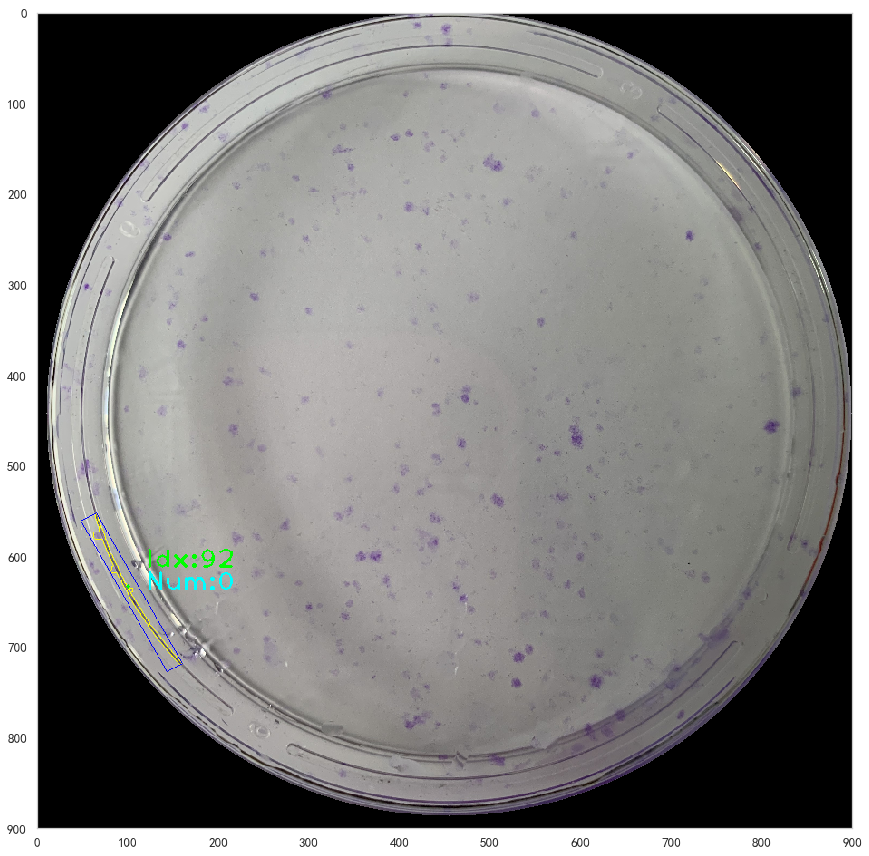

|###################################### 轮廓[92]有[0]个细胞 #########################3#########|



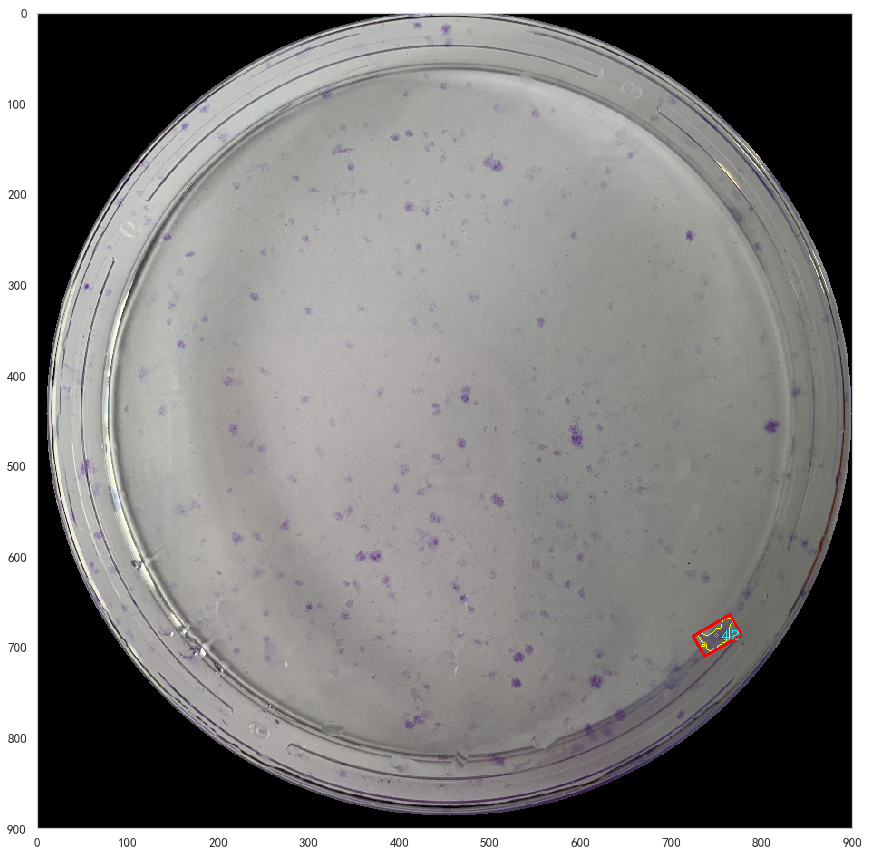

|######################################## 处理轮廓[42] #######################################|

|---------------------------------------> 自适应阈值调节 <-------------------------------------|
HSV配置参数: hsv_low=[100, 20, 50], hsv_up=[200, 250, 200]
轮廓面积： [625.0]
各轮廓均满足面积条件,自适应反馈调整结束
满足颜色面积条件
轮廓形状分析，面积625.0


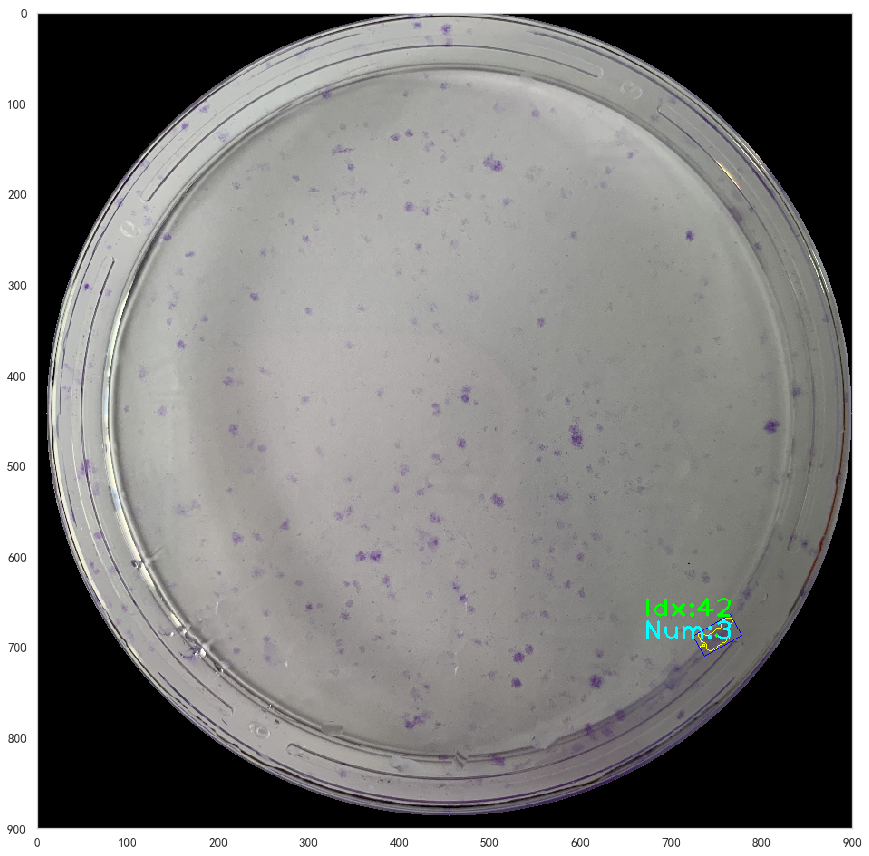

|###################################### 轮廓[42]有[3]个细胞 #########################3#########|



In [74]:
for idx in ill_cnts_list:
    # 处理前的原始轮廓
    hsv_agent.draw_single_cnts(idx)
    
    popu_analyser.getitem_test(idx)

## 全图测试

In [22]:
# 【掩盖测试信息】
def prt(*args):
    # print(*args)
    pass

def plt_show(img_ndarray, figsize=(24,6), gray=True):
    """默认画灰度图"""
#     plt.figure(figsize=figsize)
#     plt.grid(False)
#     if gray:
#         plt.imshow(img_ndarray, 'gray')
#     else:
#         plt.imshow(img_ndarray)
#     plt.show()
    pass

def plt_show_(img_ndarray, figsize=(24,6), gray=True):
    """默认画灰度图"""
    plt.figure(figsize=figsize)
    plt.grid(False)
    if gray:
        plt.imshow(img_ndarray, 'gray')
    else:
        plt.imshow(img_ndarray)
    plt.show()


In [23]:
def cell_population_count_test(img_path, config):
    start = time.time()
    img_bgr = cv2.imread(img_path)  # 读入图像并转换格式
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    seg_img_rgb = img_seg(img_rgb)  # 分割出培养皿 抹掉其他部分

    hsv_agent = HsvImgCntAgent(seg_img_rgb, config)  # 过滤出轮廓  实例化对象时自动在构造函数中处理了轮廓...

    popu_analyser = PopuCntAnalyser(seg_img_rgb, config, agent=hsv_agent, adaptive=True)

    for idx in range(len(hsv_agent.cnts)):
        popu_analyser[idx]
    popu_analyser.show_count_result()
    end = time.time()
    print("运行消耗时间：{}".format(end - start))
    prt('检测总轮廓数', popu_analyser.total_popu)
    
    return popu_analyser.total_popu

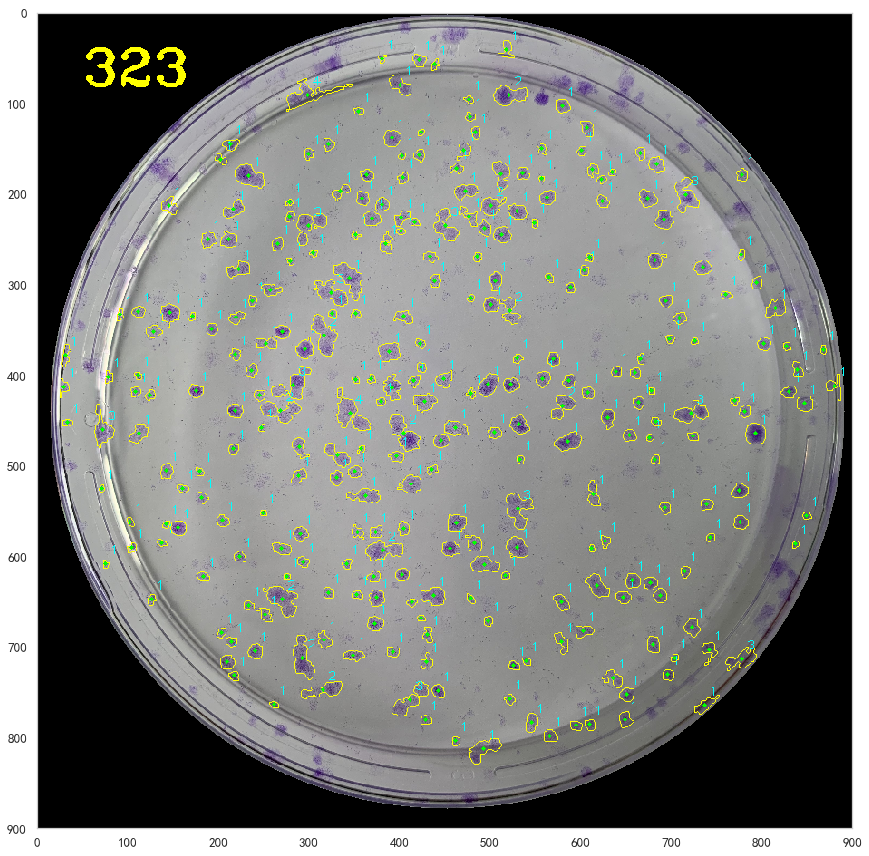

运行消耗时间：9.932856559753418


In [24]:
num = cell_population_count_test(img_file, paticular_engine_config)